# Sommaire :
 - [Bibliothèques utilisées](#Bibliothèques-utilisées)
 - [Chargement des données](#Chargement-des-données)
 
**[Etape 1 : Nettoyage du jeu de données](#1.-Nettoyage-du-jeu-de-données)**
 - [Filtrage des features et produits](#filtrage-des-features-et-produits)
 - [Formule de calcul du nutri-score](#la-formule-de-calcul-du-Nutri-Score-se-trouve-sur-ce-lien-ici)
 - [Suppression des lignes dupliquées](#suppression-des-lignes-dupliquées)
 
**[Etape 2 : Identification des valeurs aberrantes](#2.-Identification-des-valeurs-aberrantes)**
 - [Distribution des valeurs aberrantes](#distribution-des-valeurs-abberantes)
 - [Detection des outliers par la methode statistique des interquertilles](#Detection-des-outliers-par-la-methode-statistique-des-interquertilles)

**[Etape 3 : Identification et traitement des valeurs manquantes](#3.-Identification-et-traitement-des-valeurs-manquantes)**
 - [Visualisation des valeurs manquantes](#Visualisation-des-valeurs-manquantes)
 - [Nettoyage des données manquantes via KNN](#Nettoyage-des-données-manquantes-via-KNN)
 
**[Etape 4 : Analyse uni-variée et bi-variée](#4.-Analyse-uni-variée-et-bi-variée)**
 - [Analyse uni-variée](#Analyse-univariée)
     - [Variables quantitatives](#Variables-quantitatives)
         - [fiber_100g](#Variable-fiber_100g)
         - [energy_100g](#Variable-energy_100g)
         - [sugars_100g](#Variable-sugars_100g)
         - [sodium_100g](#Variable-sodium_100g)
         - [saturated-fat_100g](#Variable-saturated-fat_100g)
         - [salt_100g](#Variable-salt_100g)
         - [proteins_100g](#Variable-proteins_100g)
         - [nutrition-score-fr_100g](#Variable-nutrition-score-fr_100g)
     - [Variables qualitatives](#Variables-qualitatives)
         - [nutrition_grade_fr](#Variable-nutrition_grade_fr)
 - [Analyse bi-variée](#Analyse-Bivariée)

**[Etape 5 : Analyse multi-variée](#5.-Analyse-Multi-Variée)**
 - [Analyse en composante principale (PCA)](#analyse-en-composante-principale)</a>
 - [Analyse de la variance (ANOVA)](#Analyse-de-la-variance)</a>

### Bibliothèques utilisées

1. pandas (version 2.2.3) : Chargement, nettoyage et manipulation de données.
2. numpy (version 2.1.3) : Calculs mathématiques et manipulation de données numériques.
3. matplotlib (version 3.9.2) : Création de graphiques simples et complexes.
4. seaborn (version 0.13.2) : Visualisations avancées avec des graphiques esthétiques.
5. missingno (version 0.5.2): Visaulaisations des valeurs manquates
6. statsmodels (version 0.14.4): stats

In [279]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
from sklearn import decomposition
from sklearn import preprocessing
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.utils import resample
from scipy.stats import normaltest, kruskal
import statsmodels.api as sm
from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error
#from matplotlib.patches import Circle

## Chargement des données

In [107]:
pd.set_option('display.max_info_columns', 163)
pd.set_option('display.max_rows', 1000)

In [108]:
# charger les données dans un dataframe
data = pd.read_csv("data/openfoodfacts.csv", sep="\t")

/tmp/ipykernel_703655/2536198238.py:2: DtypeWarning: Columns (0,3,5,19,20,24,25,26,27,28,35,36,37,38,39,48) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("data/openfoodfacts.csv", sep="\t")


In [109]:
# afficher les six premieres lignes du jeu de donnée
data.head(6)

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,3087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
2,4559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
3,16087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
4,16094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,16100,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055651,2017-03-09T10:34:11Z,1489055651,2017-03-09T10:34:11Z,Breadshop Honey Gone Nuts Granola,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


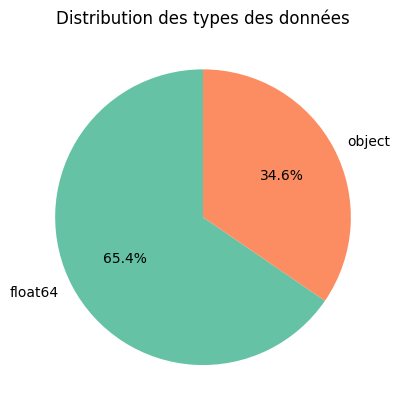

In [110]:
dtype_counts = data.dtypes.value_counts()

dtype_counts.plot.pie(autopct="%1.1f%%", labels=dtype_counts.index, startangle=90, colors=["#66c2a5", "#fc8d62", "#8da0cb", "#e78ac3"])
plt.title("Distribution des types des données")
plt.ylabel("")  # Remove default ylabel
plt.show()

In [111]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 162 columns):
 #    Column                                      Non-Null Count   Dtype  
---   ------                                      --------------   -----  
 0    code                                        320749 non-null  object 
 1    url                                         320749 non-null  object 
 2    creator                                     320770 non-null  object 
 3    created_t                                   320769 non-null  object 
 4    created_datetime                            320763 non-null  object 
 5    last_modified_t                             320772 non-null  object 
 6    last_modified_datetime                      320772 non-null  object 
 7    product_name                                303010 non-null  object 
 8    generic_name                                52795 non-null   object 
 9    quantity                                    104819 non-nu

In [112]:
# Statts sur les variables quantitaves
data.describe()

,no_nutriments,additives_n,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,nutrition_grade_uk,energy_100g,energy-from-fat_100g,fat_100g,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
count,0.0,248939.000000,248939.000000,0.0,248939.000000,0.0,0.0,2.611130e+05,857.000000,243891.000000,...,49.000000,3036.000000,165.000000,948.000000,0.0,268.000000,221210.000000,221210.000000,0.0,0.0
mean,NaN,1.936024,0.019659,NaN,0.055246,NaN,NaN,1.141915e+03,585.501214,12.730379,...,6.425698,31.458587,15.412121,49.547785,NaN,341.700764,9.165535,9.058049,NaN,NaN
std,NaN,2.502019,0.140524,NaN,0.269207,NaN,NaN,6.447154e+03,712.809943,17.578747,...,2.047841,31.967918,3.753028,18.757932,NaN,425.211439,9.055903,9.183589,NaN,NaN
min,NaN,0.000000,0.000000,NaN,0.000000,NaN,NaN,0.000000e+00,0.000000,0.000000,...,0.000000,0.000000,8.000000,6.000000,NaN,0.000000,-15.000000,-15.000000,NaN,NaN
25%,NaN,0.000000,0.000000,NaN,0.000000,NaN,NaN,3.770000e+02,49.400000,0.000000,...,6.300000,0.000000,12.000000,32.000000,NaN,98.750000,1.000000,1.000000,NaN,NaN
50%,NaN,1.000000,0.000000,NaN,0.000000,NaN,NaN,1.100000e+03,300.000000,5.000000,...,7.200000,23.000000,15.000000,50.000000,NaN,195.750000,10.000000,9.000000,NaN,NaN
75%,NaN,3.000000,0.000000,NaN,0.000000,NaN,NaN,1.674000e+03,898.000000,20.000000,...,7.400000,51.000000,15.000000,64.250000,NaN,383.200000,16.000000,16.000000,NaN,NaN
max,NaN,31.000000,2.000000,NaN,6.000000,NaN,NaN,3.251373e+06,3830.000000,714.290000,...,8.400000,100.000000,25.000000,100.000000,NaN,2842.000000,40.000000,40.000000,NaN,NaN


In [113]:
# Stats sur les variables quanlitatives
data.describe(include='O')

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states,states_tags,states_fr,main_category,main_category_fr,image_url,image_small_url
count,320749,320749,320770,320769,320763,320772,320772,303010,52795,104819,...,221210,91513,94491,320726,320726,320726,84366,84366,75836,75836
unique,320638,320749,3535,189636,189568,180639,180495,221347,38584,13826,...,5,14,42,1021,1021,1021,3543,3543,75836,75836
top,16571940331,http://world-fr.openfoodfacts.org/produit/9999...,usda-ndb-import,1489077120,2017-03-09T16:32:00Z,1439141742,2015-08-09T17:35:42Z,Ice Cream,Pâtes alimentaires au blé dur de qualité supér...,500 g,...,d,unknown,unknown,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",en:beverages,Boissons,http://fr.openfoodfacts.org/images/products/99...,http://fr.openfoodfacts.org/images/products/99...
freq,2,1,169868,20,20,33,33,410,201,4669,...,62763,22624,22624,168905,168905,168905,6054,6054,1,1


# 1. Nettoyage du jeu de données

## filtrage des features et produits

In [114]:
def test_completion(data):
    var_dict = {}
    
    for col in data.columns:
        var_dict[col] = []
        var_dict[col].append(round((data[col].isna().sum()/data.shape[0])*100,2))
        var_dict[col].append(data[col].isna().sum())
        
    return pd.DataFrame.from_dict(data=var_dict, orient="index", columns = ["Taux d'incomplétude (%)", "Nombre de valeurs manquantes"]).sort_values(by="Taux d'incomplétude (%)", ascending=False)

In [115]:
test_completion(data)

,Taux d'incomplétude (%),Nombre de valeurs manquantes
ingredients_from_palm_oil,100.00,320772
no_nutriments,100.00,320772
elaidic-acid_100g,100.00,320772
nervonic-acid_100g,100.00,320772
maltodextrins_100g,100.00,320761
serum-proteins_100g,100.00,320756
nucleotides_100g,100.00,320763
glycemic-index_100g,100.00,320772
water-hardness_100g,100.00,320772
chlorophyl_100g,100.00,320772


## la formule de calcul du Nutri-Score se trouve sur ce lien [ici](https://www.santepubliquefrance.fr/media/files/02-determinants-de-sante/nutrition-et-activite-physique/nutri-score/qr-scientifique-technique-en)

Cette formule nous a permi de comprendre, quels sont les elements (variables) sont essentiels pour determiner le nutri-score d'un produit donné.

In [116]:
relevant_columns = [
    'quantity', 'categories', 'product_name', 'nutrition_grade_fr', 'brands',
    'energy-from-fat_100g', 'energy_100g', 'saturated-fat_100g', 'sugars_100g', 'sodium_100g',
    'fiber_100g', 'proteins_100g', 'fruits-vegetables-nuts_100g',
    'nutrition-score-fr_100g', 'pnns_groups_1', 'pnns_groups_2'
]
data = data[relevant_columns]
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 16 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   quantity                     104819 non-null  object 
 1   categories                   84410 non-null   object 
 2   product_name                 303010 non-null  object 
 3   nutrition_grade_fr           221210 non-null  object 
 4   brands                       292360 non-null  object 
 5   energy-from-fat_100g         857 non-null     float64
 6   energy_100g                  261113 non-null  float64
 7   saturated-fat_100g           229554 non-null  float64
 8   sugars_100g                  244971 non-null  float64
 9   sodium_100g                  255463 non-null  float64
 10  fiber_100g                   200886 non-null  float64
 11  proteins_100g                259922 non-null  float64
 12  fruits-vegetables-nuts_100g  3036 non-null    float64
 13 

In [117]:
test_completion(data)

,Taux d'incomplétude (%),Nombre de valeurs manquantes
energy-from-fat_100g,99.73,319915
fruits-vegetables-nuts_100g,99.05,317736
categories,73.69,236362
pnns_groups_1,71.47,229259
pnns_groups_2,70.54,226281
quantity,67.32,215953
fiber_100g,37.37,119886
nutrition_grade_fr,31.04,99562
nutrition-score-fr_100g,31.04,99562
saturated-fat_100g,28.44,91218


## suppression des lignes dupliquées

In [118]:
duplicated = data[data.duplicated() == True ]
print(f"Nombre de lignes dupliquées: {len(duplicated)}")

Nombre de lignes dupliquées: 20666


In [119]:
# Suppression des duplicated
data.drop_duplicates(inplace=True)

In [120]:
test_completion(data)

,Taux d'incomplétude (%),Nombre de valeurs manquantes
energy-from-fat_100g,99.71,299249
fruits-vegetables-nuts_100g,98.99,297071
categories,71.93,215877
pnns_groups_1,69.96,209963
pnns_groups_2,68.98,207013
quantity,65.16,195558
fiber_100g,34.70,104131
nutrition_grade_fr,27.95,83878
nutrition-score-fr_100g,27.95,83878
saturated-fat_100g,25.34,76046


In [121]:
"""
Nous allons identifier les lignes considérées comme vides.
Une ligne est définie comme vide si aucune des variables nutritionnelles sélectionnées (fibres, énergie, sucres, sodium, acides gras saturés, et protéines) n'a de valeur renseignée (toutes sont `NaN`).
Une fois les lignes vides identifiées, elles seront supprimées du DataFrame.
"""
empty_rows = data[data["fiber_100g"].isna() & 
              data["energy_100g"].isna() &
              data["sugars_100g"].isna() &
              data["sodium_100g"].isna() &
              data["saturated-fat_100g"].isna() &
              data["proteins_100g"].isna() &
              data["proteins_100g"].isna()
]
empty_rows.groupby(['pnns_groups_1', 'pnns_groups_2']).size()

pnns_groups_1            pnns_groups_2                   
Beverages                Artificially sweetened beverages       6
                         Fruit juices                         196
                         Fruit nectars                         46
                         Non-sugared beverages               2061
                         Sweetened beverages                  223
Cereals and potatoes     Bread                                247
                         Breakfast cereals                     95
                         Cereals                              410
                         Legumes                              171
                         Potatoes                              69
Composite foods          One-dish meals                       626
                         Pizza pies and quiche                 51
                         Sandwich                              45
Fat and sauces           Dressings and sauces                 800
                  

In [122]:
data = data.drop(labels = empty_rows.index)

In [123]:
pnns_groups_unknown = data.loc[data.pnns_groups_2 == 'unknown']
pnns_groups_unknown

,quantity,categories,product_name,nutrition_grade_fr,brands,energy-from-fat_100g,energy_100g,saturated-fat_100g,sugars_100g,sodium_100g,fiber_100g,proteins_100g,fruits-vegetables-nuts_100g,nutrition-score-fr_100g,pnns_groups_1,pnns_groups_2
106,NaN,NaN,Lion Peanut x2,e,Sunridge,NaN,1883.0,12.500,57.50,0.038000,2.50,2.50,NaN,22.0,unknown,unknown
138,NaN,NaN,Pack de 2 Twix,NaN,"Twix, Lundberg",NaN,1481.0,NaN,NaN,NaN,6.20,6.25,NaN,NaN,unknown,unknown
181,1.008 kg / 12 pain,Boulange,Pain Burger Artisan,b,Kirkland Signature,NaN,1160.0,0.333,1.11,0.600000,2.22,10.00,NaN,1.0,unknown,unknown
222,454g,"Desserts,Christmas Puddings,Puddings",Luxury Christmas Pudding,c,"Asda,Asda Extra Special",NaN,1284.0,3.600,44.00,0.078740,4.70,3.90,NaN,10.0,unknown,unknown
231,500ml,NaN,Diet Coke,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320600,200 ml,"Aliments et boissons à base de végétaux,Alimen...",Crème de coco allégée,d,Ayam,NaN,543.0,11.000,1.50,0.011811,0.50,1.30,NaN,11.0,unknown,unknown
320618,260g,"Asian Grocery,Palm Sugar",Jeenys Palm Sugar,d,Jeenys,NaN,1690.0,0.500,90.00,0.009000,0.10,1.00,NaN,15.0,unknown,unknown
320669,190 g,Sauce à l'ail,Allioli,NaN,Chovi,NaN,3121.0,10.000,0.00,NaN,0.10,1.10,NaN,NaN,unknown,unknown
320670,400 g,NaN,Cacao,c,Banania,NaN,1568.0,1.200,68.00,0.023622,6.40,5.70,NaN,10.0,unknown,unknown


In [124]:
data = data.drop(labels = pnns_groups_unknown.index)

In [125]:
test_completion(data)

,Taux d'incomplétude (%),Nombre de valeurs manquantes
energy-from-fat_100g,99.75,241545
fruits-vegetables-nuts_100g,99.12,240009
pnns_groups_1,77.16,186831
categories,77.07,186615
pnns_groups_2,77.07,186629
quantity,75.79,183523
fiber_100g,22.40,54252
nutrition_grade_fr,15.38,37233
nutrition-score-fr_100g,15.38,37233
saturated-fat_100g,12.28,29732


# 2. Identification des valeurs aberrantes

## distribution des valeurs abberantes

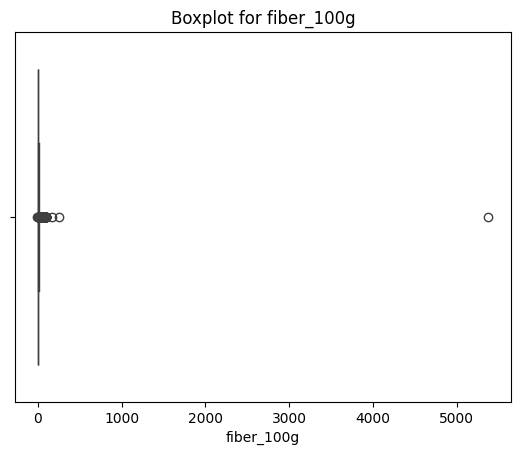

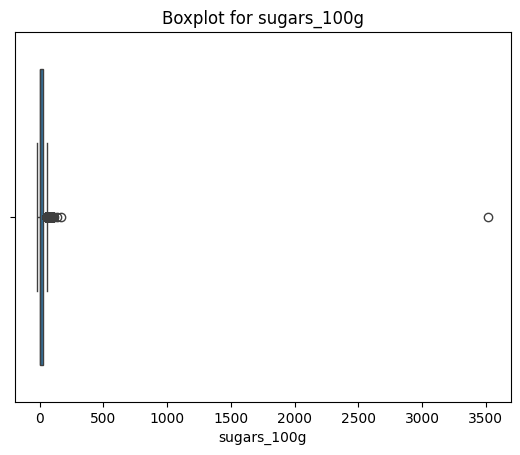

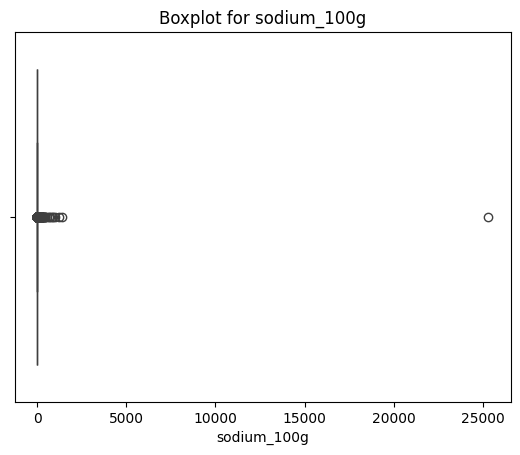

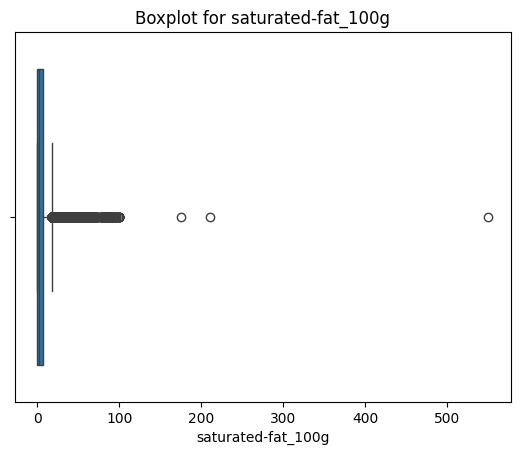

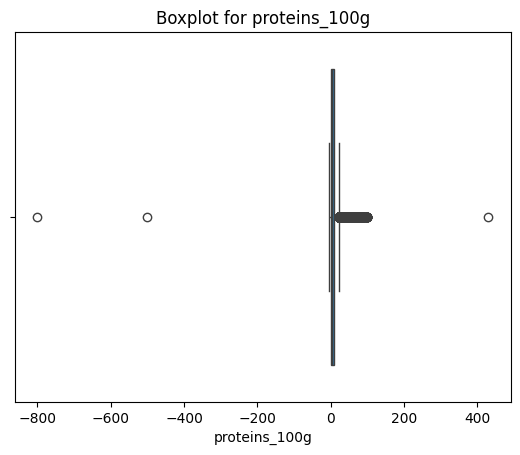

In [126]:
cols = ['fiber_100g', 'sugars_100g', 'sodium_100g', 'saturated-fat_100g', 'proteins_100g']
for col in cols:
    # Visualisation des outliers
    sns.boxplot(x=data[col])
    plt.title(f"Boxplot for {col}")
    plt.xlabel(col)
    plt.show()

In [127]:
data[cols].describe()

,fiber_100g,sugars_100g,sodium_100g,saturated-fat_100g,proteins_100g
count,187895.000000,226936.000000,236519.000000,212415.000000,240214.000000
mean,2.848946,16.012356,0.797363,5.134793,7.083126
std,13.233333,22.337104,52.478391,8.059838,8.375820
min,-6.700000,-17.860000,0.000000,0.000000,-800.000000
25%,0.000000,1.370000,0.025000,0.000000,0.700000
50%,1.500000,5.880000,0.232000,1.790000,4.760000
75%,3.600000,24.000000,0.543307,7.140000,10.000000
max,5380.000000,3520.000000,25320.000000,550.000000,430.000000


### Detection des outliers par la methode statistique des interquertilles

In [128]:
# les quartiles Q1 et Q3

Q1 = data[cols].quantile(0.25)
Q3 = data[cols].quantile(0.75)


# l'interquartile
IQR = Q3 - Q1

# les bornes supérieures et inférieures
upper_bound = Q3 + 1.5 * IQR
lower_bound = Q1 - 1.5 * IQR
filter = pd.Series(False, index=data.index)
for col in cols:
    filter |= (data[col] < lower_bound[col]) | (data[col] >= upper_bound[col])

outliers = data[filter]
display(outliers[cols])

,fiber_100g,sugars_100g,sodium_100g,saturated-fat_100g,proteins_100g
1,3.6,14.29,0.000000,28.57,3.57
7,9.4,15.62,0.055000,4.69,14.06
8,7.5,42.50,NaN,22.50,5.00
10,12.5,NaN,NaN,NaN,22.92
13,38.1,NaN,0.038000,4.76,19.05
...,...,...,...,...,...
320676,NaN,NaN,0.929000,21.43,25.00
320683,0.0,0.00,0.300000,0.00,25.00
320732,NaN,16.67,6.333000,NaN,16.67
320741,10.0,1.00,3.937008,1.00,10.00


In [129]:
# Remplacer les outliers par NaN
for col in cols:
    data.loc[
        (data[col] < lower_bound[col]) | (data[col] > upper_bound[col]),
        col
    ] = np.nan

In [130]:
data[cols].describe()

,fiber_100g,sugars_100g,sodium_100g,saturated-fat_100g,proteins_100g
count,174655.000000,212716.000000,221365.000000,196342.000000,228580.000000
mean,1.903776,12.155893,0.284227,3.491579,5.908908
std,2.213550,15.134912,0.305823,4.554394,6.022032
min,0.000000,-17.860000,0.000000,0.000000,-3.570000
25%,0.000000,1.100000,0.019000,0.000000,0.500000
50%,1.200000,4.800000,0.190000,1.330000,4.260000
75%,3.285000,18.500000,0.467000,5.680000,9.000000
max,9.000000,57.900000,1.320000,17.840000,23.940000


# 3. Identification et traitement des valeurs manquantes

In [131]:
test_completion(data)

,Taux d'incomplétude (%),Nombre de valeurs manquantes
energy-from-fat_100g,99.75,241545
fruits-vegetables-nuts_100g,99.12,240009
pnns_groups_1,77.16,186831
categories,77.07,186615
pnns_groups_2,77.07,186629
quantity,75.79,183523
fiber_100g,27.87,67492
saturated-fat_100g,18.92,45805
nutrition-score-fr_100g,15.38,37233
nutrition_grade_fr,15.38,37233


In [132]:
# Le total de valeurs manquantes
missing_values = data.isna().sum()
print("Nombre de valeurs manquantes")
print(missing_values)
total_missing_values = missing_values.sum()
print(f"Le total de valeurs manquante est de: {total_missing_values}, soit un pourcenatge de {100*(total_missing_values / data.size)}" )

Nombre de valeurs manquantes
quantity                       183523
categories                     186615
product_name                     2736
nutrition_grade_fr              37233
brands                           5332
energy-from-fat_100g           241545
energy_100g                       941
saturated-fat_100g              45805
sugars_100g                     29431
sodium_100g                     20782
fiber_100g                      67492
proteins_100g                   13567
fruits-vegetables-nuts_100g    240009
nutrition-score-fr_100g         37233
pnns_groups_1                  186831
pnns_groups_2                  186629
dtype: int64
Le total de valeurs manquante est de: 1485704, soit un pourcenatge de 38.34716102202381


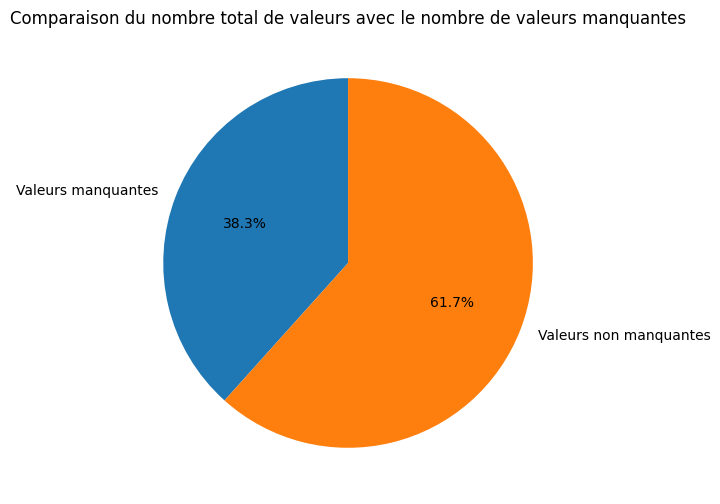

In [133]:
labels = ['Valeurs manquantes', 'Valeurs non manquantes']

values = [total_missing_values, data.size - total_missing_values]

plt.figure(figsize=(8, 6))
plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=90)

plt.title("Comparaison du nombre total de valeurs avec le nombre de valeurs manquantes")

plt.show()


Pour la suite de notre nettoyage, nous allons consideré uniquement les populations dont la colonne **nutrition_grade_fr** est renseignée.

Nous allons egalement supprimer les colonnes qui ont un taux d'incomplétude superieure à 50%.
<br/>

In [134]:
filtered_data = data.loc[data['nutrition_grade_fr'].notna(),:]

cols_to_drop = [col for col in filtered_data.columns 
                if (100 * filtered_data[col].isnull().sum() / len(filtered_data)) > 50]
filtered_data  = filtered_data.drop(columns=cols_to_drop)
test_completion(filtered_data)

,Taux d'incomplétude (%),Nombre de valeurs manquantes
fiber_100g,17.60,36060
saturated-fat_100g,7.36,15088
proteins_100g,5.19,10637
sodium_100g,5.08,10404
sugars_100g,4.96,10164
brands,2.00,4103
product_name,1.07,2198
nutrition_grade_fr,0.00,0
energy_100g,0.00,0
nutrition-score-fr_100g,0.00,0


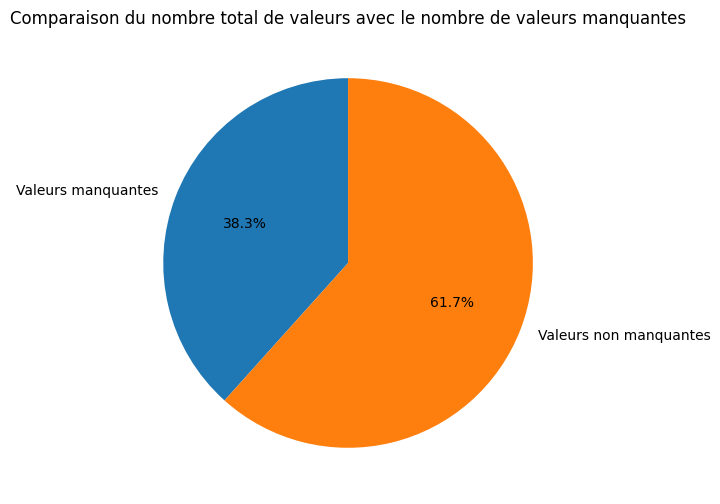

In [135]:
labels = ['Valeurs manquantes', 'Valeurs non manquantes']

values = [total_missing_values, data.size - total_missing_values]

plt.figure(figsize=(8, 6))
plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=90)

plt.title("Comparaison du nombre total de valeurs avec le nombre de valeurs manquantes")

plt.show()


In [136]:
filtered_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 204914 entries, 1 to 320768
Data columns (total 10 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   product_name             202716 non-null  object 
 1   nutrition_grade_fr       204914 non-null  object 
 2   brands                   200811 non-null  object 
 3   energy_100g              204914 non-null  float64
 4   saturated-fat_100g       189826 non-null  float64
 5   sugars_100g              194750 non-null  float64
 6   sodium_100g              194510 non-null  float64
 7   fiber_100g               168854 non-null  float64
 8   proteins_100g            194277 non-null  float64
 9   nutrition-score-fr_100g  204914 non-null  float64
dtypes: float64(7), object(3)
memory usage: 17.2+ MB


In [137]:
filtered_data.describe()

,energy_100g,saturated-fat_100g,sugars_100g,sodium_100g,fiber_100g,proteins_100g,nutrition-score-fr_100g
count,204914.000000,189826.000000,194750.000000,194510.000000,168854.000000,194277.000000,204914.000000
mean,1182.018796,3.425341,12.081019,0.301178,1.903892,6.569200,9.179929
std,955.792179,4.500636,15.137805,0.301846,2.216082,5.971945,9.069626
min,0.000000,0.000000,-17.860000,0.000000,0.000000,-3.570000,-15.000000
25%,452.000000,0.000000,1.100000,0.038000,0.000000,1.600000,1.000000
50%,1197.000000,1.300000,4.580000,0.232000,1.200000,5.200000,10.000000
75%,1724.000000,5.430000,18.940000,0.481000,3.300000,9.900000,16.000000
max,231199.000000,17.840000,57.900000,1.320000,9.000000,23.940000,40.000000


In [138]:
categorical_cols = filtered_data.select_dtypes(exclude=["float64", "int64"])
numerical_cols = filtered_data.select_dtypes(include=["float64", "int64"])

display(categorical_cols)

,product_name,nutrition_grade_fr,brands
1,Banana Chips Sweetened (Whole),d,NaN
2,Peanuts,b,Torn & Glasser
3,Organic Salted Nut Mix,d,Grizzlies
7,Organic Muesli,c,Daddy's Muesli
12,Zen Party Mix,d,Sunridge
...,...,...,...
320742,Natural Cassava,a,Industria De Casabe Paul
320751,Tartines craquantes bio au sarrasin,a,Le Pain des fleurs
320757,Amandes,b,Biosic
320763,Thé vert Earl grey,c,Lobodis


### Visualisation des valeurs manquantes

#### Matrice

La matrice nous permet de visualiser la complétude des données (variables)

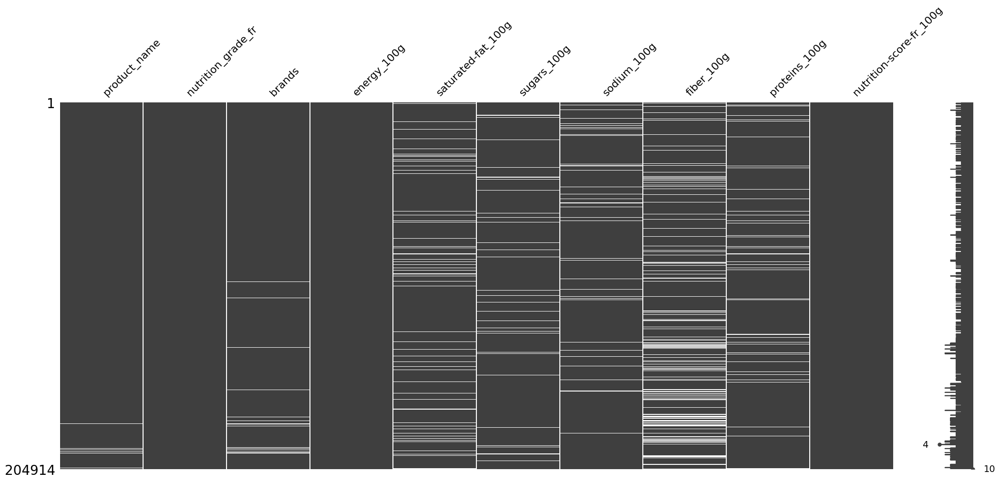

In [139]:
msno.matrix(filtered_data)
plt.savefig('t.png')

plt.show()

#### Heatmap

Le diagramme heatmap permet de visulaiser la corrélation de complétude entre les variables.

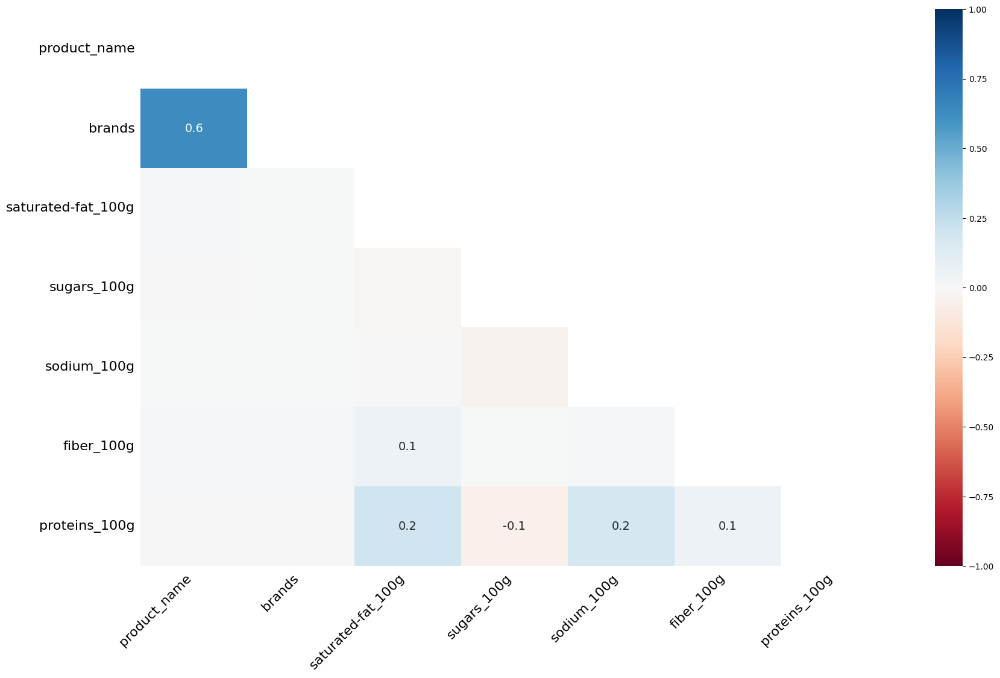

In [140]:
msno.heatmap(filtered_data)
plt.show()

#### Dendrogram

Le dendrogramme revèle des tendances plus profondes que celles par paires visibles dans le precédent heatmap

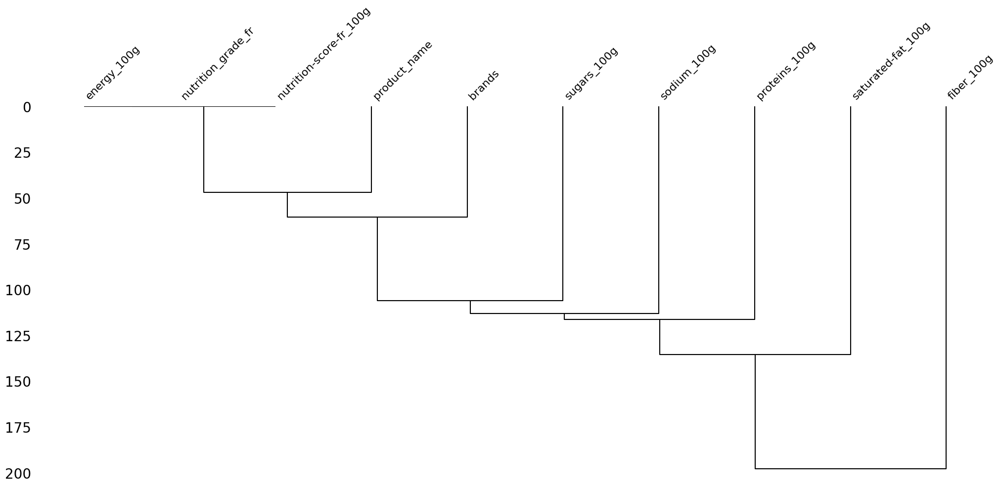

In [141]:
msno.dendrogram(filtered_data)
plt.show()

### Nettoyage des données manquantes via KNN

In [142]:
numerical_cols.describe()

,energy_100g,saturated-fat_100g,sugars_100g,sodium_100g,fiber_100g,proteins_100g,nutrition-score-fr_100g
count,204914.000000,189826.000000,194750.000000,194510.000000,168854.000000,194277.000000,204914.000000
mean,1182.018796,3.425341,12.081019,0.301178,1.903892,6.569200,9.179929
std,955.792179,4.500636,15.137805,0.301846,2.216082,5.971945,9.069626
min,0.000000,0.000000,-17.860000,0.000000,0.000000,-3.570000,-15.000000
25%,452.000000,0.000000,1.100000,0.038000,0.000000,1.600000,1.000000
50%,1197.000000,1.300000,4.580000,0.232000,1.200000,5.200000,10.000000
75%,1724.000000,5.430000,18.940000,0.481000,3.300000,9.900000,16.000000
max,231199.000000,17.840000,57.900000,1.320000,9.000000,23.940000,40.000000


Le choix du nombre de voisins (k) est très important. Pour cela, nous allons comparer les k voisins en nous basant sur la métrique de l'erreur quadratique moyenne (Mean Squared Error).

In [177]:
def best_k(df):
    df_missing = pd.DataFrame(np.nan, index=range(5000), columns=numerical_cols.columns)
    
    X_train = resample(df_without_missing, n_samples=2500, random_state=42)
    
    errors = []
    k_values = range(2, 5)
    
    for k in k_values:
        imputer = KNNImputer(n_neighbors=k)
        imputer.fit(X_train)
        X_imputed = imputer.transform(df_with_missing)
        
        # Calculer l'erreur entre les données imputées et les vraies données
        mse = mean_squared_error(df.values, X_imputed)
        errors.append(mse)

    return k_values, errors

In [178]:
k_values, errors = best_k(numerical_cols.dropna().iloc[:5000])

Meilleur k : 2


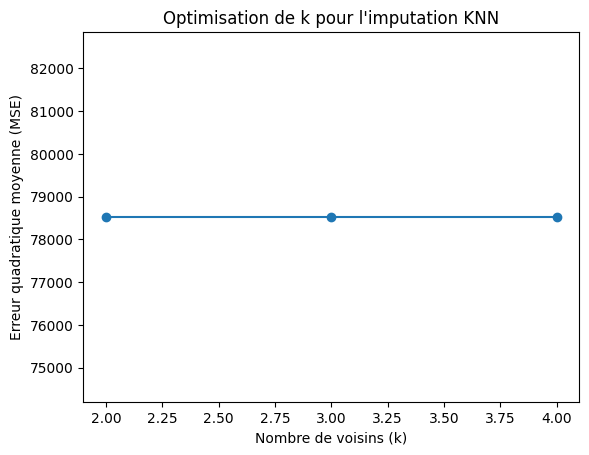

In [180]:
best_k = k_values[np.argmin(errors)]
print(f"Meilleur k : {best_k}")
    
# Visualiser l'évolution de l'erreur en fonction de k
plt.plot(k_values, errors, marker='o')
plt.xlabel("Nombre de voisins (k)")
plt.ylabel("Erreur quadratique moyenne (MSE)")
plt.title("Optimisation de k pour l'imputation KNN")
plt.show()

Maintenant nous allons imputer nos données avec k=2, resultat de notre precedente fonction

In [175]:
df_subset = resample(numerical_cols, n_samples=5000, random_state=42)
imputer = KNNImputer(n_neighbors=best_k)
imputer.fit(df_subset)
result = imputer.transform(numerical_cols)
numerical_imputed = pd.DataFrame(result, columns=numerical_cols.columns)

In [39]:
numerical_imputed.describe()

,energy_100g,saturated-fat_100g,sugars_100g,sodium_100g,fiber_100g,proteins_100g,nutrition-score-fr_100g
count,204914.000000,204914.000000,204914.000000,204914.000000,204914.000000,204914.000000,204914.000000
mean,1182.018796,3.892212,12.794153,0.312286,1.965125,6.840163,9.179929
std,955.792179,4.766695,15.325646,0.303484,2.168545,6.106216,9.069626
min,0.000000,0.000000,-17.860000,0.000000,0.000000,-3.570000,-15.000000
25%,452.000000,0.000000,1.300000,0.039370,0.000000,1.800000,1.000000
50%,1197.000000,1.760000,5.000000,0.248031,1.320000,5.500000,10.000000
75%,1724.000000,6.670000,21.210000,0.500000,3.300000,10.000000,16.000000
max,231199.000000,17.840000,57.900000,1.320000,9.000000,23.940000,40.000000


In [40]:
test_completion(numerical_imputed)

,Taux d'incomplétude (%),Nombre de valeurs manquantes
energy_100g,0.0,0
saturated-fat_100g,0.0,0
sugars_100g,0.0,0
sodium_100g,0.0,0
fiber_100g,0.0,0
proteins_100g,0.0,0
nutrition-score-fr_100g,0.0,0


In [41]:
imputer = SimpleImputer(strategy="most_frequent")

res = imputer.fit_transform(pd.DataFrame(categorical_cols, columns=categorical_cols.columns))
categorical_imputed= pd.DataFrame(res, columns=categorical_cols.columns)

In [42]:
test_completion(categorical_imputed)

,Taux d'incomplétude (%),Nombre de valeurs manquantes
product_name,0.0,0
nutrition_grade_fr,0.0,0
brands,0.0,0


In [183]:
data  = numerical_imputed.merge(categorical_imputed, how='inner', left_index=True, right_index=True)
display(data.head(5))

,energy_100g,saturated-fat_100g,sugars_100g,sodium_100g,fiber_100g,proteins_100g,nutrition-score-fr_100g,product_name,nutrition_grade_fr,brands
0,2243.0,5.355,14.29,0.000,3.60,3.57,14.0,Banana Chips Sweetened (Whole),d,Carrefour
1,1941.0,0.000,17.86,0.250,7.10,17.86,0.0,Peanuts,b,Torn & Glasser
2,2540.0,5.360,3.57,0.482,7.10,17.86,12.0,Organic Salted Nut Mix,d,Grizzlies
3,1833.0,4.690,15.62,0.055,8.15,14.06,7.0,Organic Muesli,c,Daddy's Muesli
4,2230.0,5.000,3.33,0.633,6.70,16.67,12.0,Zen Party Mix,d,Sunridge


In [44]:
def compute_iqr(df, col):
    """
    Calcule l'écart interquartile (IQR) pour une colonne donnée dans un DataFrame.

    Parameters:
    -----------
    df : pandas.DataFrame
        Le DataFrame contenant les données.
    col : str
        Le nom de la colonne pour laquelle l'IQR doit être calculé.

    Returns:
    --------
    outliers: pandas.DataFrame
    """
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    
    IQR = Q3 - Q1
    
    upper_bound = Q3 + 1.5 * IQR
    lower_bound = Q1 - 1.5 * IQR

    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

    return outliers

In [176]:
def clean_data():
    # Chargement des données
    data = pd.read_csv("data/openfoodfacts.csv", sep="\t")
    print(f"Nombre de lignes avant nettoyage: {len(data)}")

    # Variables pertinentes selon la formule de calcul du nutri-score
    relevant_columns = [
        'quantity', 'categories', 'product_name', 'nutrition_grade_fr', 'brands',
        'energy-from-fat_100g', 'energy_100g', 'saturated-fat_100g', 'sugars_100g', 'sodium_100g',
        'fiber_100g', 'proteins_100g', 'fruits-vegetables-nuts_100g',
        'nutrition-score-fr_100g', 'pnns_groups_1', 'pnns_groups_2'
    ]
    data = data[relevant_columns]

    # Suppression des doublons
    duplicated = data[data.duplicated() == True ]
    print(f"Nombre de lignes dupliquées: {len(duplicated)}")
    data.drop_duplicates(inplace=True)


    """
        Nous allons identifier les lignes considérées comme vides.
        Une ligne est définie comme vide si aucune des variables nutritionnelles sélectionnées (fibres, énergie, sucres, sodium, acides gras saturés, sel, et protéines) n'a de valeur renseignée (toutes sont `NaN`).
        Une fois les lignes vides identifiées, elles seront supprimées du DataFrame.
    """
    empty_rows = data[data["fiber_100g"].isna() & 
              data["energy_100g"].isna() &
              data["sugars_100g"].isna() &
              data["sodium_100g"].isna() &
              data["saturated-fat_100g"].isna() &
              data["proteins_100g"].isna() &
              data["proteins_100g"].isna()
    ]
    data = data.drop(labels = empty_rows.index)


    """
    Nettoyage des valeurs aberrantes des variables quantitaives:
    1. Nous allons utiliser la methode statistique de calcul des interquartiles pour identifier les valeurs aberantes.
    2. Nous allons ensuite remplacer ces valeurs par des 'NAN' (valeurs manquantes) que nous traitons dans la phase de nettoyage.
    """
    cols = ['fiber_100g', 'energy_100g', 'sugars_100g', 'sodium_100g', 'saturated-fat_100g', 'proteins_100g', 'nutrition-score-fr_100g']

    Q1 = data[cols].quantile(0.25)
    Q3 = data[cols].quantile(0.75)
    
    IQR = Q3 - Q1
    
    upper_bound = Q3 + 1.5 * IQR
    lower_bound = Q1 - 1.5 * IQR
    filter = pd.Series(False, index=data.index)
    for col in cols:
        filter |= (data[col] < lower_bound[col]) | (data[col] > upper_bound[col])
    
    outliers = data[filter]
    print(f"Nombre de valeurs aberrantes trouvées : {len(outliers)}")
    
    # Remplacer les outliers par NaN
    for col in cols:
        data.loc[
            (data[col] < lower_bound[col]) | (data[col] > upper_bound[col]),
            col
        ] = np.nan

    """
    Filtrer les données :
    1. Nous conservons uniquement les lignes pour lesquelles la colonne 'nutrition_grade_fr' est renseignée (non nulle).
    2. Ensuite, nous identifions les colonnes dont le taux de valeurs manquantes dépasse 50% (incomplétude supérieure à 50%).
    3. Ces colonnes identifiées sont supprimées du DataFrame filtré.
    """
    filtered_data = data.loc[data['nutrition_grade_fr'].notna(),:]

    cols_to_drop = [col for col in filtered_data.columns 
                if (100 * filtered_data[col].isnull().sum() / len(filtered_data)) > 50]
    filtered_data  = filtered_data.drop(columns=cols_to_drop)
    
    """
    Traitement des valeurs manquantes : 
    1. Séparation des colonnes en deux types :
       - Colonnes catégorielles : Identifiées comme celles qui ne sont pas de type numérique (`float64`, `int64`).
       - Colonnes numériques : Identifiées comme celles de type numérique (`float64`, `int64`).
    2. Imputation des valeurs manquantes pour les colonnes numériques :
       - Un sous-échantillon de 5000 lignes est créé à partir des colonnes numériques pour entraîner le modèle KNNImputer.
       - Le KNNImputer est utilisé avec 2 voisins pour imputer les valeurs manquantes des colonnes numériques.
       - Les données imputées sont transformées en DataFrame pour les colonnes numériques.
    3. Imputation des valeurs manquantes pour les colonnes catégorielles :
       - Le SimpleImputer, avec la stratégie "most_frequent", remplace les valeurs manquantes par la modalité la plus fréquente de chaque colonne catégorielle.
       - Les données imputées sont transformées en DataFrame pour les colonnes catégorielles.
    4. Fusion des colonnes numériques et catégorielles imputées :
       - Les colonnes sont fusionnées en un seul DataFrame `cleaned_data` en utilisant une jointure interne sur les index.
    5. Le DataFrame final `cleaned_data`, contenant toutes les valeurs imputées, est retourné.
    """

    categorical_cols = filtered_data.select_dtypes(exclude=["float64", "int64"])
    numerical_cols = filtered_data.select_dtypes(include=["float64", "int64"])
    
    print('Imputaion en cours ....')
    # Imputation des valeurs manquantes pour les colonnes numériques
    df_ = resample(numerical_cols, n_samples=5000, random_state=42)
    imputer = KNNImputer(n_neighbors=2)
    imputer.fit(df_)
    result = imputer.transform(numerical_cols)
    numerical_imputed = pd.DataFrame(result, columns=numerical_cols.columns)
    
    # Imputation des valeurs manquantes pour les colonnes catégoriques
    imputer = SimpleImputer(strategy="most_frequent")
    res = imputer.fit_transform(pd.DataFrame(categorical_cols, columns=categorical_cols.columns))
    categorical_imputed= pd.DataFrame(res, columns=categorical_cols.columns)
    
    # Fusion des colonnes numériques et catégoriques imputées
    cleaned_data  = numerical_imputed.merge(categorical_imputed, how='inner', left_index=True, right_index=True)
    
    print(f"Nombre de lignes aprés nettoyage: {len(cleaned_data)}")
    
    return cleaned_data

In [184]:
cleaned_data = clean_data()

/tmp/ipykernel_703655/2447377628.py:3: DtypeWarning: Columns (0,3,5,19,20,24,25,26,27,28,35,36,37,38,39,48) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("data/openfoodfacts.csv", sep="\t")


Nombre de lignes avant nettoyage: 320772
Nombre de lignes dupliquées: 20666
Nombre de valeurs aberrantes trouvées : 62724
Imputaion en cours ....
Nombre de lignes aprés nettoyage: 216037


In [187]:
test_completion(cleaned_data)

,Taux d'incomplétude (%),Nombre de valeurs manquantes
energy_100g,0.0,0
saturated-fat_100g,0.0,0
sugars_100g,0.0,0
sodium_100g,0.0,0
fiber_100g,0.0,0
proteins_100g,0.0,0
nutrition-score-fr_100g,0.0,0
product_name,0.0,0
nutrition_grade_fr,0.0,0
brands,0.0,0


# 4. Analyse uni-variée et bi-variée

## Analyse univariée

### Variables quantitatives

#### Variable fiber_100g

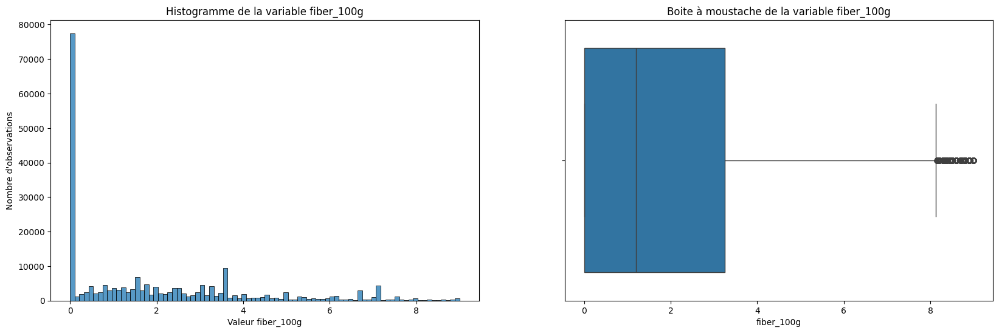

In [296]:
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(20, 6))
#ax0.bar(cleaned_data.fiber_100g.value_counts().index, cleaned_data.fiber_100g.value_counts().values, width=3.5)
sns.histplot(cleaned_data.fiber_100g, ax=ax0)
ax0.set_xlabel("Valeur fiber_100g")
ax0.set_ylabel("Nombre d'observations")
ax0.set_title("Histogramme de la variable fiber_100g")

sns.boxplot(x=cleaned_data.fiber_100g, ax=ax1)
ax1.set_title("Boite à moustache de la variable fiber_100g")
plt.show()

In [49]:
print("Statistiques de distribution")
display(cleaned_data.fiber_100g.describe())

Statistiques de distribution


count    216037.000000
mean          1.910247
std           2.134043
min           0.000000
25%           0.000000
50%           1.300000
75%           3.200000
max           9.000000
Name: fiber_100g, dtype: float64

#### Variable energy_100g

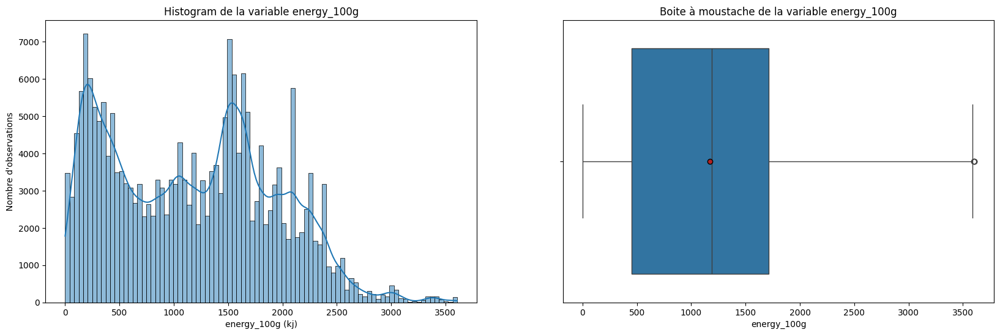

In [214]:
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(20, 6))
sns.histplot(cleaned_data.energy_100g, ax=ax0, kde=True)
ax0.set_xlabel("energy_100g (kj)")
ax0.set_ylabel("Nombre d'observations")
ax0.set_title("Histogram de la variable energy_100g")

meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot(x=cleaned_data.energy_100g, ax=ax1, showmeans=True, meanprops=meanprops)
ax1.set_title("Boite à moustache de la variable energy_100g")
plt.show()

In [189]:
print("Statistiques de distribution")
display(cleaned_data.energy_100g.describe())

Statistiques de distribution


count    216037.000000
mean       1171.923324
std         750.150621
min           0.000000
25%         454.000000
50%        1188.000000
75%        1711.000000
max        3607.000000
Name: energy_100g, dtype: float64

L'histogramme a montré que la distribution de la variable energy_100g est asymétrique à droite. Nous allons confirmer cela à l'aide d'une méthode statistique.

In [54]:
skewness = cleaned_data.energy_100g.skew()

print(f"mesure d'asymetrie de la variable energy_100g: {skewness}")

mesure d'asymetrie de la variable energy_100g: 0.22612550834200226


La mesure d'asymétrie confirme une distribution légèrement étalées à droite.

#### Variable sugars_100g

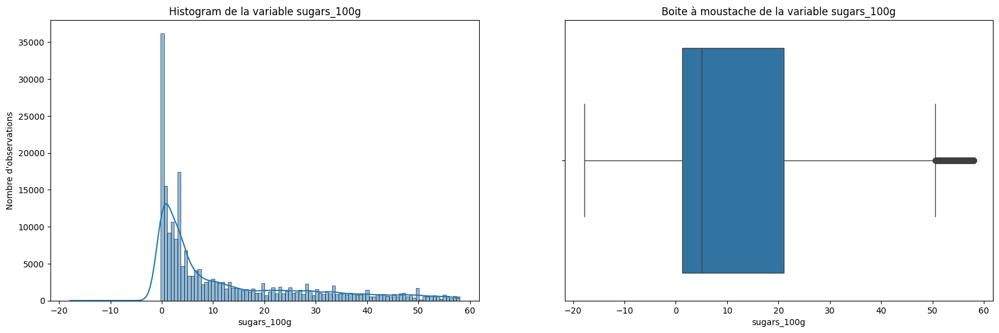

In [55]:
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(20, 6))
sns.histplot(cleaned_data.sugars_100g, ax=ax0, kde=True)
ax0.set_xlabel("sugars_100g")
ax0.set_ylabel("Nombre d'observations")
ax0.set_title("Histogramme de la variable sugars_100g")

sns.boxplot(x=cleaned_data.sugars_100g, ax=ax1)
ax1.set_title("Boite à moustache de la variable sugars_100g")
plt.show()

In [56]:
print("Statistiques de distribution")
display(cleaned_data.sugars_100g.describe())

Statistiques de distribution


count    216037.000000
mean         12.706618
std          15.296382
min         -17.860000
25%           1.270000
50%           5.000000
75%          20.990000
max          58.000000
Name: sugars_100g, dtype: float64

In [57]:
sugars_100g_outliers = compute_iqr(cleaned_data, 'sugars_100g')

print(f"Nous avons {len(sugars_100g_outliers)} observation avec un taux de sucre s'eloignant des valeurs normales ")

Nous avons 6368 observation avec un taux de sucre s'eloignant des valeurs normales 


#### Variable sodium_100g

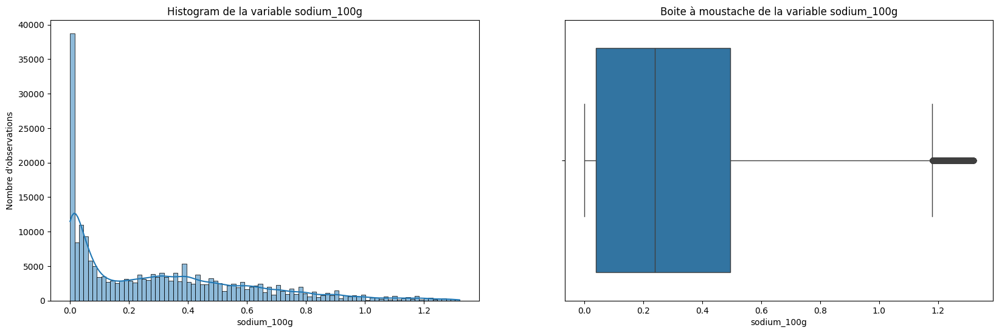

In [58]:
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(20, 6))
sns.histplot(cleaned_data.sodium_100g, ax=ax0, kde=True)
ax0.set_xlabel("sodium_100g")
ax0.set_ylabel("Nombre d'observations")
ax0.set_title("Histogramme de la variable sodium_100g")

sns.boxplot(x=cleaned_data.sodium_100g, ax=ax1)
ax1.set_title("Boite à moustache de la variable sodium_100g")
plt.show()

In [59]:
print("Statistiques de distribution")
display(cleaned_data.sodium_100g.describe())

Statistiques de distribution


count    216037.000000
mean          0.307817
std           0.301384
min           0.000000
25%           0.039370
50%           0.240000
75%           0.496000
max           1.320000
Name: sodium_100g, dtype: float64

In [60]:
sodium_100g_outliers = compute_iqr(cleaned_data, 'sodium_100g')

print(f"Nous avons {len(sodium_100g_outliers)} observation avec un taux de sodium s'eloignant des valeurs normales ")

Nous avons 2398 observation avec un taux de sodium s'eloignant des valeurs normales 


#### Variable saturated-fat_100g

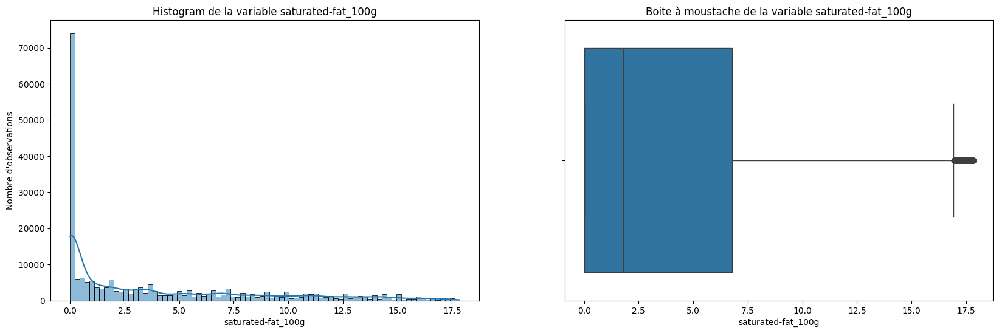

In [61]:
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(20, 6))
sns.histplot(cleaned_data['saturated-fat_100g'], ax=ax0, kde=True)
ax0.set_xlabel("saturated-fat_100g")
ax0.set_ylabel("Nombre d'observations")
ax0.set_title("Histogramme de la variable saturated-fat_100g")

sns.boxplot(x=cleaned_data['saturated-fat_100g'], ax=ax1)
ax1.set_title("Boite à moustache de la variable saturated-fat_100g")
plt.show()

In [62]:
print("Statistiques de distribution")
display(cleaned_data['saturated-fat_100g'].describe())

Statistiques de distribution


count    216037.000000
mean          3.925922
std           4.748839
min           0.000000
25%           0.000000
50%           1.790000
75%           6.770000
max          17.840000
Name: saturated-fat_100g, dtype: float64

#### Variable proteins_100g

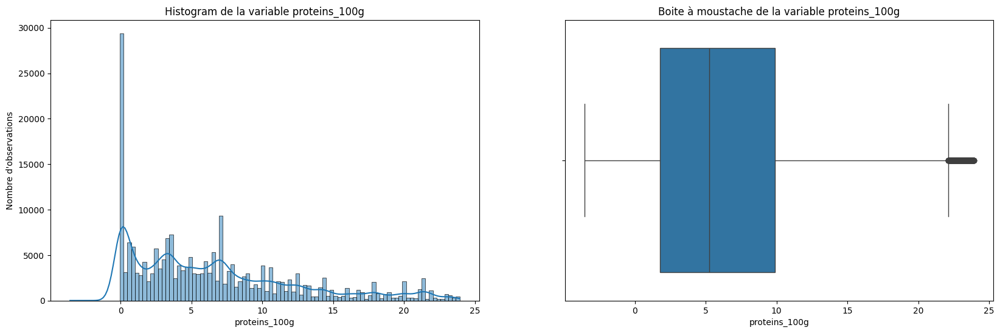

In [63]:
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(20, 6))
sns.histplot(cleaned_data.proteins_100g, ax=ax0, kde=True)
ax0.set_xlabel("proteins_100g")
ax0.set_ylabel("Nombre d'observations")
ax0.set_title("Histogram de la variable proteins_100g")

sns.boxplot(x=cleaned_data.proteins_100g, ax=ax1)
ax1.set_title("Boite à moustache de la variable proteins_100g")
plt.show()

In [64]:
print("Statistiques de distribution")
display(cleaned_data.proteins_100g.describe())

Statistiques de distribution


count    216037.000000
mean          6.579163
std           5.896633
min          -3.570000
25%           1.750000
50%           5.260000
75%           9.900000
max          23.930000
Name: proteins_100g, dtype: float64

#### Variable nutrition-score-fr_100g

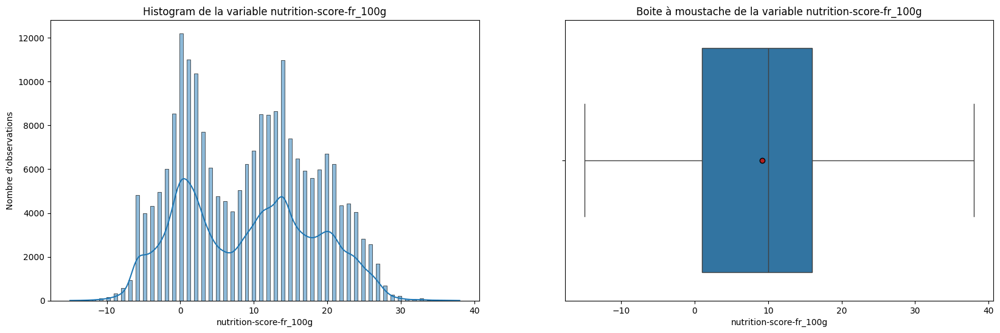

In [236]:
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(20, 6))
sns.histplot(cleaned_data['nutrition-score-fr_100g'], ax=ax0, kde=True)
ax0.set_xlabel("nutrition-score-fr_100g")
ax0.set_ylabel("Nombre d'observations")
ax0.set_title("Histogramme de la variable nutrition-score-fr_100g")

meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot(x=cleaned_data['nutrition-score-fr_100g'], ax=ax1, showmeans=True, meanprops=meanprops)
ax1.set_title("Boite à moustache de la variable nutrition-score-fr_100g")
plt.show()

In [66]:
print("Statistiques de distribution")
display(cleaned_data['nutrition-score-fr_100g'].describe())

Statistiques de distribution


count    216037.000000
mean          9.173515
std           9.050224
min         -15.000000
25%           1.000000
50%          10.000000
75%          16.000000
max          38.000000
Name: nutrition-score-fr_100g, dtype: float64

In [67]:
# Mesure d'asymetrie
skewness = cleaned_data['nutrition-score-fr_100g'].skew()

print(f"mesure d'asymetrie de la variable nutrition-score-fr_100g: {skewness}")

mesure d'asymetrie de la variable nutrition-score-fr_100g: 0.11350931966523614


Le résultat empirique montre qu'avec un coefficient d'asymétrie (skewness) de 0,11, on peut conclure que la variable est légèrement asymétrique à droite. Pour verifier notre hypothèses sur la normalité de la distribution de notre variable, nous allons effectuer un test statistique.

In [68]:
stat, p = normaltest(cleaned_data['nutrition-score-fr_100g'])
if p > 0.05:
    print(f"Les données suivent une distribution normale (p-value = {p})")
else:
    print(f"Les données ne suivent pas une distribution normale (p-value = {p})")


Les données ne suivent pas une distribution normale (p-value = 0.0)


Nous rejetons notre hypothése nulle (H0)

Le QQ Plot (Quantile-Quantile Plot) suivant permet d'appuyer visuellement notre analyse.

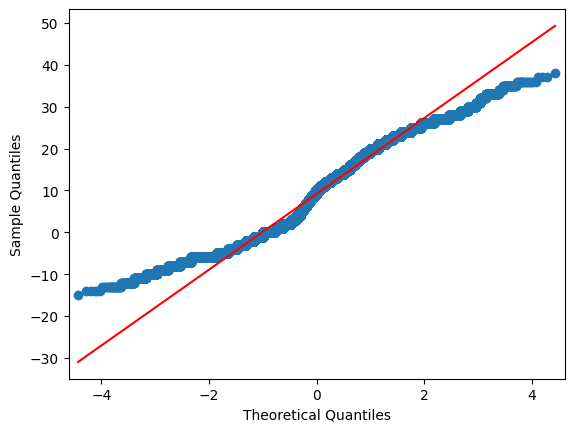

In [69]:
sm.qqplot(cleaned_data['nutrition-score-fr_100g'], line='s')
plt.show()

*Test Kruskal-wallis*

Hypothèese:
- L'hypothèse nulle (H0) : La médiane est la même pour tous les groupes de données.
- L'hypothèse alternative : (Ha) : La médiane n'est pas égale pour tous les groupes de données.

In [249]:
quantiles = pd.qcut(cleaned_data['nutrition-score-fr_100g'], 4, labels=['Q1', 'Q2', 'Q3', 'Q4'])

# Affichage des catégories
print("Répartition des catégories :")
print(quantiles.value_counts())

# Séparation des groupes selon les quantiles
group_1 = cleaned_data['nutrition-score-fr_100g'].loc[quantiles == 'Q1']
group_2 = cleaned_data['nutrition-score-fr_100g'].loc[quantiles == 'Q2']
group_3 = cleaned_data['nutrition-score-fr_100g'].loc[quantiles == 'Q3']
group_4 = cleaned_data['nutrition-score-fr_100g'].loc[quantiles == 'Q4']

# Test de Kruskal-Wallis
stat, p_value = kruskal(group_1, group_2, group_3, group_4)

# Résultats
print("\nRésultats du test de Kruskal-Wallis :")
print("Statistique de test:", stat)
print("Valeur p:", p_value)

alpha = 0.05
if p_value < alpha:
    print("\nRejet de l'hypothèse nulle : les groupes ont des distributions différentes.")
else:
    print("\nAucune différence significative entre les groupes.")

Répartition des catégories :
nutrition-score-fr_100g
Q1    58053
Q2    55662
Q4    51813
Q3    50509
Name: count, dtype: int64

Résultats du test de Kruskal-Wallis :
Statistique de test: 202657.97234087053
Valeur p: 0.0

Rejet de l'hypothèse nulle : les groupes ont des distributions différentes.


### Variables qualitatives

#### Variable nutrition_grade_fr

Répartition des observations par modalité nutrition_grade_fr


,nombre_observations
nutrition_grade_fr,
d,61373
c,44662
e,42039
a,34730
b,33233


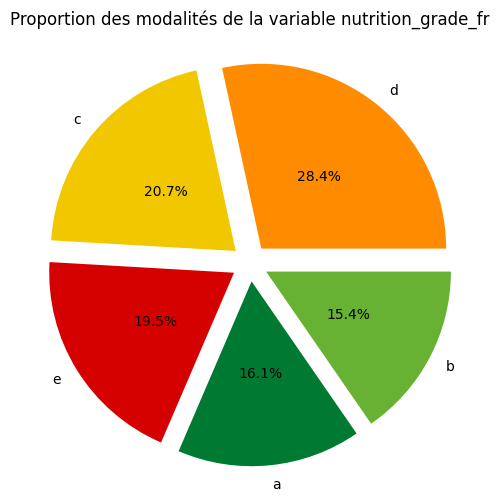

In [252]:
nutriscore_grade_groupby = cleaned_data.loc[:,["product_name","nutrition_grade_fr"]].groupby("nutrition_grade_fr").agg("count")
nutriscore_grade_groupby.rename(mapper={"product_name":"nombre_observations"}, axis=1, inplace=True)
nutriscore_grade_groupby.sort_values("nombre_observations", ascending= False, inplace = True)
print("Répartition des observations par modalité nutrition_grade_fr")
display(nutriscore_grade_groupby)

pie, ax = plt.subplots(figsize=(10,6))
labels = nutriscore_grade_groupby.index

color_mapping = {
    'a': '#007A33',
    'b': '#68B233',
    'c': '#F1C800',
    'd': '#FF8C00',
    'e': '#D50000'
}

colors = [color_mapping[label] for label in labels]


plt.pie(x=nutriscore_grade_groupby["nombre_observations"], autopct="%.1f%%", explode=[0.1]*5, labels=labels,colors=colors, pctdistance=0.5)
plt.title("Proportion des modalités de la variable nutrition_grade_fr")
plt.show()

## Analyse Bivariée

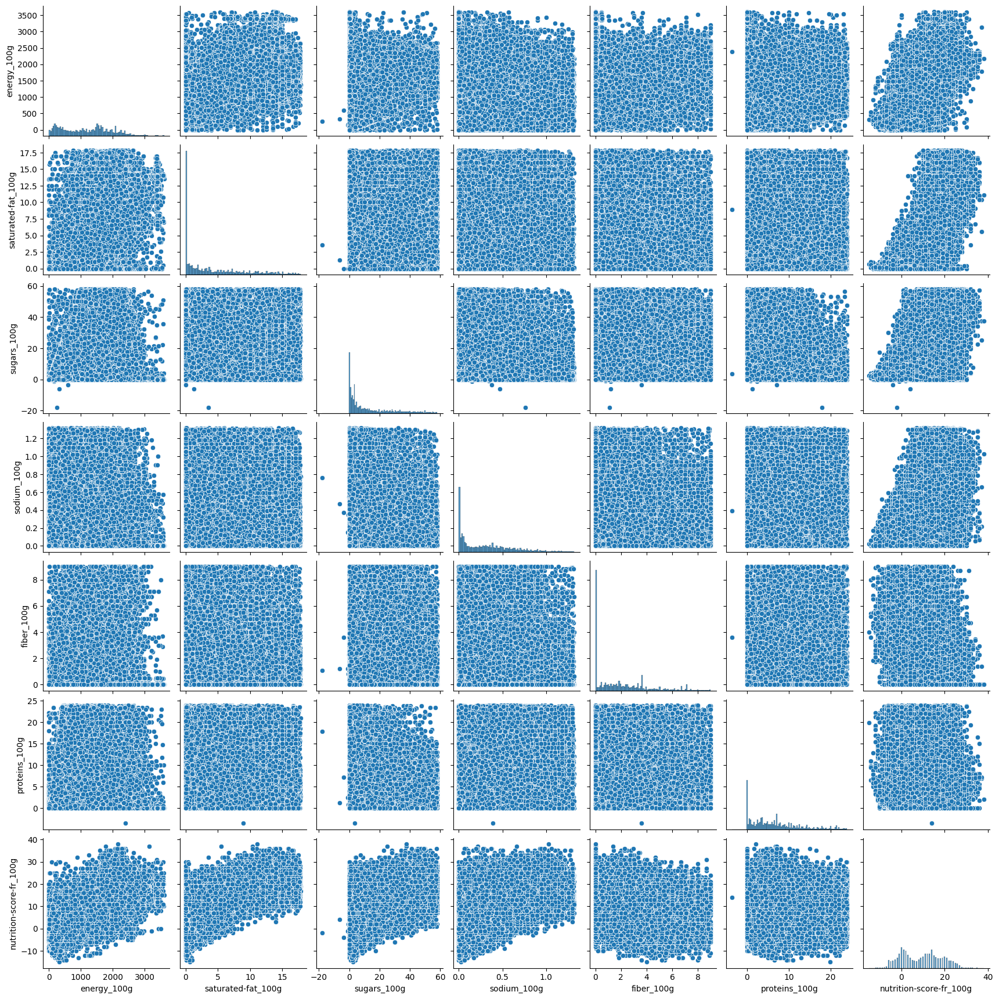

In [71]:
num_data = cleaned_data.loc[:,list(cleaned_data.select_dtypes(include=["float64", "int64"]))]
sns.pairplot(data=num_data)
plt.show()

Le graphique ci-dessus ne nous permet pas d'obtenir des informations significatives sur les relations entre nos variables.

Nous allons maintenant visualiser les relations entre nos variables et la variable `nutrition_grade_fr`

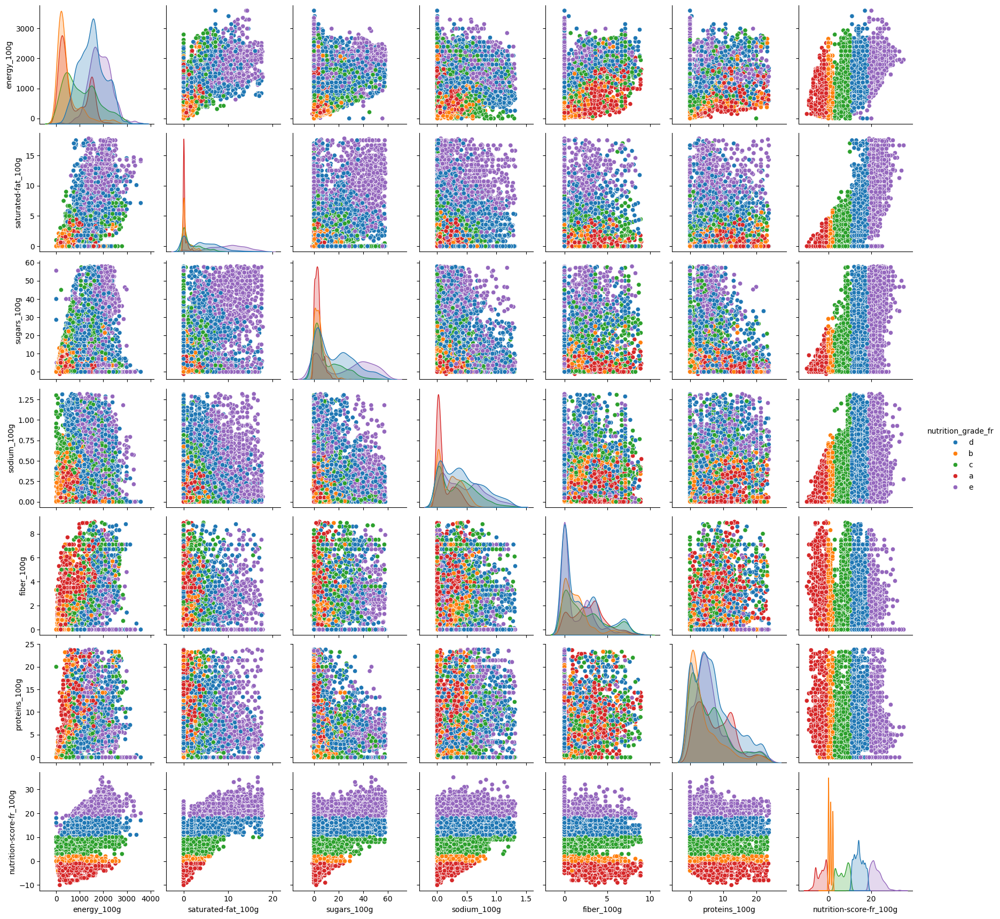

In [72]:
# Categoriser les distributions par le nutrition_grade_fr

cols = list(cleaned_data.select_dtypes(include=["float64", "int64"])) + ['nutrition_grade_fr']
data = cleaned_data.loc[:10000, cols]
sns.pairplot(data=data, hue="nutrition_grade_fr")
plt.show()

Comme pour notre précédent graphique, la dispersion ne fournit pas d'informations significatives sur les relations entre nos variables et la variable `nutrition_grade_fr`.

Nous allons maintenant visualiser la matrice de correlation pour identifier les variables corrélées à notre cible `nutrition-score-fr_100g`

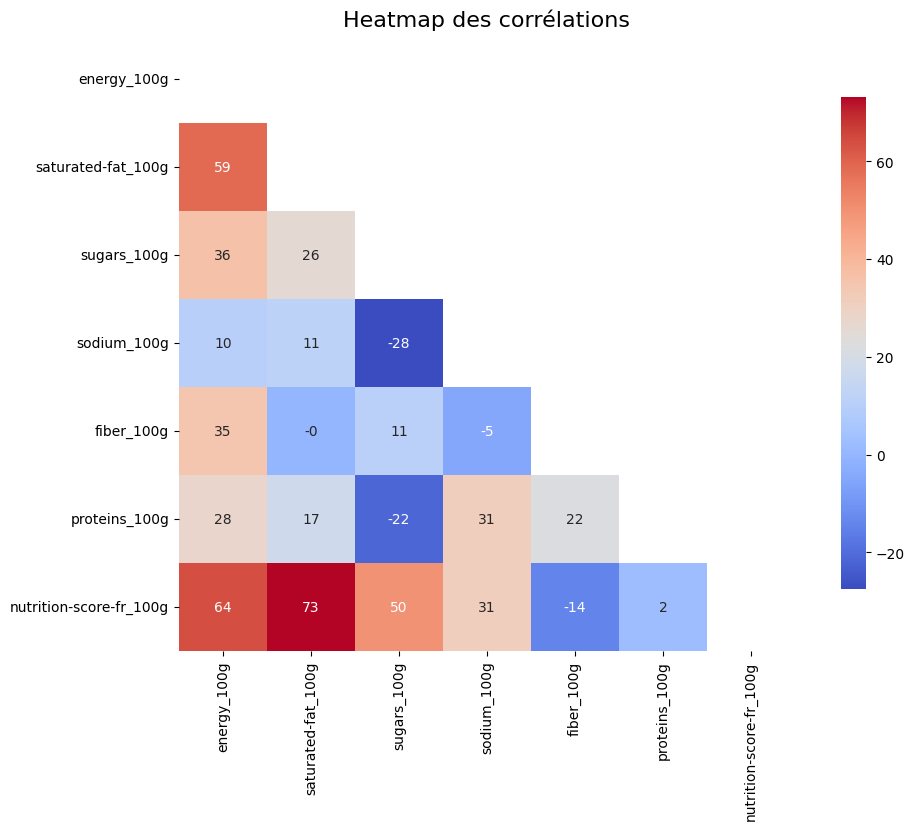

In [73]:
numerical_cols = cleaned_data.select_dtypes(include=["float64", "int64"])

correlation_matrix = numerical_cols.corr()*100
# Créer un masque pour la moitié supérieure
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix,
            mask=mask,
            annot=True,            
            fmt=".0f",             
            cmap="coolwarm",
            square=True,
            cbar_kws={"shrink": .8})
plt.title("Heatmap des corrélations", fontsize=16)
plt.show()

Nous constatons des corrélations linéaires positives fortes entre les variables saturated_fat_100g et energy_100g (59%). Egalement nous observons une corrélation positive du nutrition-score-fr_100g avec plusieurs variables de nutriements:
- energy_100g (64%)
- saturated-fat_100g (73%)
- sugars_100g (50%)
- sodium_100g (31%)
  
Afin de valider une éventuelle corréation nous procédons à un test statistique d'indépendance de Pearson sur ces couples de variables.

Hypothèses du test de Pearson :

- H₀ (hypothèse nulle) : Il n’y a pas de corrélation linéaire entre les deux variables (le coefficient de corrélation = 0).
- H₁ (hypothèse alternative) : Il existe une corrélation linéaire significative entre les deux variables.

In [74]:
def test_correlation(df, var1, var2):
    """
    Effectue un test de corrélation de Pearson entre deux variables.
    
    Parameters:
        data (pd.DataFrame): Le DataFrame contenant les variables.
        var1 (str): Nom de la première variable.
        var2 (str): Nom de la deuxième variable.
        
    Returns:
        dict: Résultats du test contenant le coefficient de corrélation et la p-valeur.
    """
    
    # Test de Pearson
    correlation, p_value = pearsonr(df[var1], df[var2])
    
    # Résumé des résultats
    results = {
        "correlation_coefficient": correlation,
        "p_value": p_value,
        "significant": p_value < 0.05  # True si la p-valeur est significative
    }
    
    return results

##### Test de Pearson entre *`saturated_fat_100g`* et *`energy_100g`*

In [75]:
results = test_correlation(cleaned_data, "energy_100g", "saturated-fat_100g")
print("Résultats du test de Pearson :")
print(f"Coefficient de corrélation : {results['correlation_coefficient']:.2f}")
print(f"P-valeur : {results['p_value']:.4f}")
if results["significant"]:
    print("La corrélation est significative (p < 0.05).")
else:
    print("La corrélation n'est pas significative (p >= 0.05).")


Résultats du test de Pearson :
Coefficient de corrélation : 0.59
P-valeur : 0.0000
La corrélation est significative (p < 0.05).


L'hypothèse H0 est rejetée avec un risque de 5%. Il existe une corrélation linéaire significative entre les deux variables.

##### Test de Pearson entre *`nutrition-scrore-fr_100g`* et *`energy_100g`*

In [76]:
results = test_correlation(cleaned_data, "nutrition-score-fr_100g", "energy_100g")
print("Résultats du test de Pearson :")
print(f"Coefficient de corrélation : {results['correlation_coefficient']:.2f}")
print(f"P-valeur : {results['p_value']:.4f}")
if results["significant"]:
    print("La corrélation est significative (p < 0.05).")
else:
    print("La corrélation n'est pas significative (p >= 0.05).")

Résultats du test de Pearson :
Coefficient de corrélation : 0.64
P-valeur : 0.0000
La corrélation est significative (p < 0.05).


L'hypothèse H0 est rejetée avec un risque de 5%. Il existe une corrélation linéaire significative entre les deux variables.

##### Test de Pearson entre *`nutrition-scrore-fr_100g`* et *`saturated-fat_100g`*

In [77]:
results = test_correlation(cleaned_data, "nutrition-score-fr_100g", "saturated-fat_100g")
print("Résultats du test de Pearson :")
print(f"Coefficient de corrélation : {results['correlation_coefficient']:.2f}")
print(f"P-valeur : {results['p_value']:.4f}")
if results["significant"]:
    print("La corrélation est significative (p < 0.05).")
else:
    print("La corrélation n'est pas significative (p >= 0.05).")

Résultats du test de Pearson :
Coefficient de corrélation : 0.73
P-valeur : 0.0000
La corrélation est significative (p < 0.05).


##### Test de Pearson entre *`nutrition-scrore-fr_100g`* et *`sugars_100g`*

In [78]:
results = test_correlation(cleaned_data, "nutrition-score-fr_100g", "sugars_100g")
print("Résultats du test de Pearson :")
print(f"Coefficient de corrélation : {results['correlation_coefficient']:.2f}")
print(f"P-valeur : {results['p_value']:.4f}")
if results["significant"]:
    print("La corrélation est significative (p < 0.05).")
else:
    print("La corrélation n'est pas significative (p >= 0.05).")

Résultats du test de Pearson :
Coefficient de corrélation : 0.50
P-valeur : 0.0000
La corrélation est significative (p < 0.05).


L'hypothèse H0 est rejetée avec un risque de 5%. Il existe une corrélation linéaire significative entre les deux variables.

# 5. Analyse Multi-Variée

## analyse en composante principale

In [260]:
quant_cols = ['fiber_100g', 'energy_100g', 'sugars_100g', 'sodium_100g', 'saturated-fat_100g', 'proteins_100g']

X = cleaned_data.loc[:, quant_cols].values
features = cleaned_data.loc[:, quant_cols].columns
n_comp = 6

In [261]:
# Standardisation des données pour avoir une moyenne de 0 et un écart-type de 1.
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

pca = decomposition.PCA(n_components=n_comp)
result = pca.fit_transform(X_scaled)

pcs = pca.components_

In [295]:
# Calcul de la variance expliquée et de la somme cumulée
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

df_results = pd.DataFrame({
    'Dimension': ["Dim" + str(i+1) for i in range(len(explained_variance))],
    'Variance Expliquée (%)': explained_variance * 100,
    'Somme Cumulée (%)': cumulative_variance * 100
})

df_results

,Dimension,Variance Expliquée (%),Somme Cumulée (%)
0,Dim1,32.804529,32.804529
1,Dim2,25.618406,58.422935
2,Dim3,17.772515,76.195450
3,Dim4,10.452907,86.648357
4,Dim5,8.352495,95.000852
5,Dim6,4.999148,100.000000


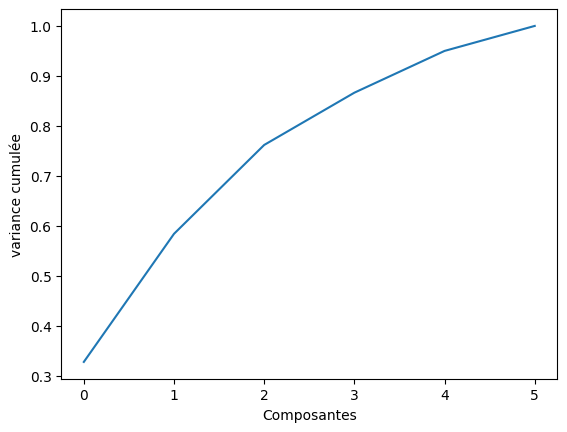

In [303]:
plt.plot(cumulative_variance)
plt.xlabel('Composantes')
plt.ylabel('variance cumulée')

plt.show()

In [288]:
def plot_pca_dim_circle(pca, features, dims, ax):
    d1, d2 = dims

    coeff = np.transpose(pca.components_[[d1,d2]])
    n = coeff.shape[0]
    
    for i in range(n):
        ax.arrow(0, 0, coeff[i, 0], coeff[i, 1], color='k', alpha=0.9, head_width=0.02, linestyle='--')
        ax.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, features[i], color='k', ha='center', va='center')
    
    circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
    ax.add_artist(circle)
    
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    

    ax.axhline(0, color='gray', linewidth=1)
    ax.axvline(0, color='gray', linewidth=1)

    ax.plot([-1, 1], [0, 0], color='grey', ls='--')
    ax.plot([0, 0], [-1, 1], color='grey', ls='--')

    ax.set_xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
    ax.set_ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))
    ax.set_title(f"Cercle des corrélations F{d1+1} et F{d2+1}")


def plot_pca_indidus(pca, features, dims, result, ax):
    d1, d2 = dims
    
    # Calcul des coordonnées des variables
    coeff = np.transpose(pca.components_[[d1,d2]])
    
    n = coeff.shape[0]
    
    #  vecteurs des variables
    for i in range(n):
        ax.arrow(0, 0, coeff[i, 0], coeff[i, 1], color='k', alpha=0.9, head_width=0.02, linestyle='--')
        ax.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, features[i], color='k', ha='center', va='center')
    
    # cercle unitaire
    circle = plt.Circle((0, 0), 1, color='gray', fill=False, linestyle='--')
    ax.add_artist(circle)
    
    color_map = {
        'a': 'green',
        'b': 'lightgreen',
        'c': 'yellow',
        'd': 'orange',
        'e': 'red'
    }
    
    # Ajout de nuage des individus
    for grade, color in color_map.items():
        idx = cleaned_data['nutrition_grade_fr'] == grade
        ax.scatter(result[idx, 0], result[idx, 1], color=color, label=grade, alpha=0.5)

    #  axes
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.axhline(0, color='gray', linewidth=1)
    ax.axvline(0, color='gray', linewidth=1)
    ax.set_xlabel('F1')
    ax.set_ylabel('F2')
    ax.set_title('Cercle de corrélation des variables pour F1 et F2 et nuage des individus')
    ax.legend(title='Nutrition Grade')

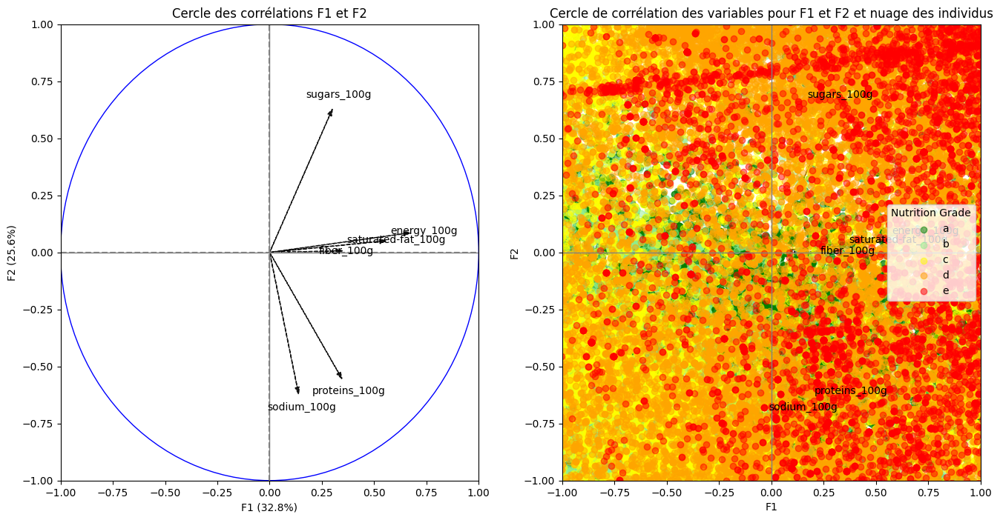

In [291]:
# Visualiser les deux premieres axes 1, 2
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
plot_pca_dim_circle(pca=pca, features=features, dims=(0,1), ax=ax1)
plot_pca_indidus(pca=pca, features=features, dims=(0,1), result=result, ax=ax2)
plt.show()

Ce cercle des corrélations permet une lecture claire des variables liées à la première composante principale. On observe que les variables proteins, saturated-fat_100g et energy_100g contribuent fortement à cette composante, ce qui reflète leur association avec des aliments riches en calories et en graisses.

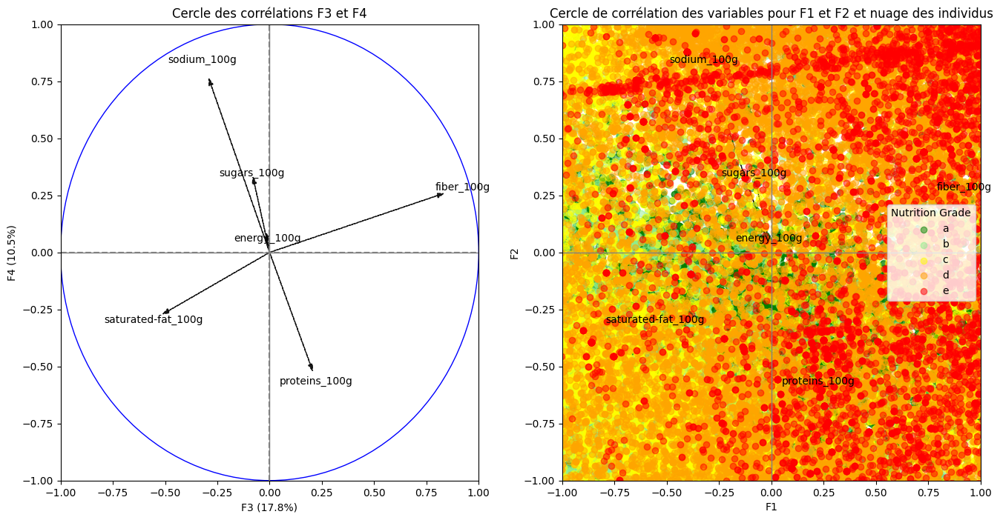

In [293]:
# Visualiser les deux axes 3, 4
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
plot_pca_dim_circle(pca=pca, features=features, dims=(2,3), ax=ax1)
plot_pca_indidus(pca=pca, features=features, dims=(2,3), result=result, ax=ax2)
plt.show()

Maintenant affichons la matrice de contribution des variables sur nos composantes

In [269]:
contribs = pd.DataFrame(pca.components_.T, columns=[f"PC{i+1}" for i in range(pca.n_components_)],index=quant_cols)

display(contribs)

,PC1,PC2,PC3,PC4,PC5,PC6
fiber_100g,0.317822,0.006097,0.802538,0.248965,-0.295668,-0.324779
energy_100g,0.642210,0.081812,-0.010036,0.053761,-0.115321,0.751388
sugars_100g,0.287245,0.601327,-0.072777,0.300795,0.635995,-0.235863
sodium_100g,0.132091,-0.591737,-0.280260,0.733446,0.086995,-0.091338
saturated-fat_100g,0.526975,0.048061,-0.483808,-0.255927,-0.405427,-0.506012
proteins_100g,0.329993,-0.528406,0.194731,-0.491128,0.568201,-0.099565


## Analyse de la variance

Analyse du couple **nutrition-score-fr_100g** et **nutriscore_grade**

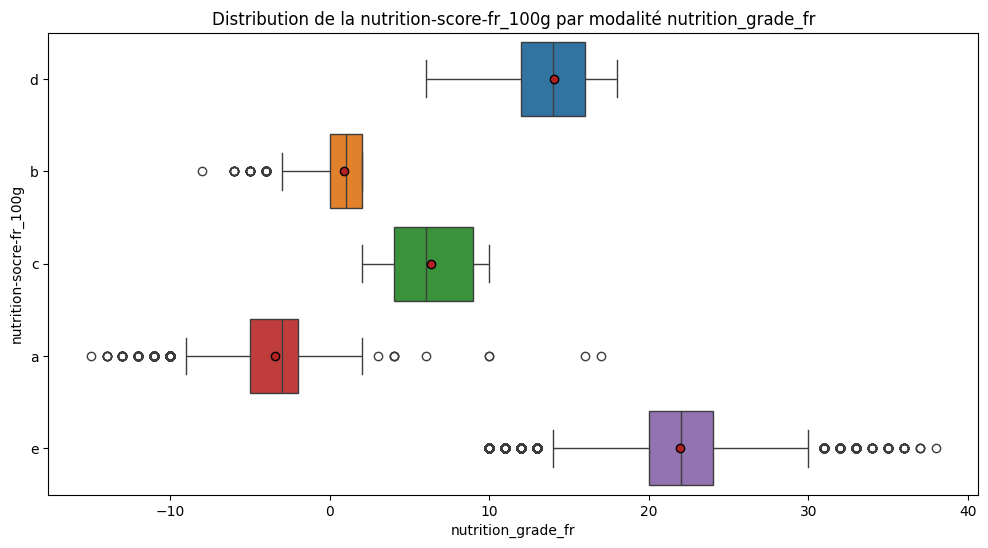

In [310]:
fig = plt.figure(figsize=(12,6))
meanprops = {'marker':'o', 'markeredgecolor':'black', 'markerfacecolor':'firebrick'}
ax = sns.boxplot(data=cleaned_data, y='nutrition_grade_fr', x='nutrition-score-fr_100g', hue='nutrition_grade_fr', meanprops=meanprops, showmeans=True)
ax.set_title("Distribution de la nutrition-score-fr_100g par modalité nutrition_grade_fr")
ax.set_xlabel("nutrition_grade_fr")
ax.set_ylabel("nutrition-socre-fr_100g")

plt.show()

In [89]:
from statsmodels.formula.api import ols
data_copy = cleaned_data.copy()
data_copy.rename({"nutrition-score-fr_100g": "nutrition_score_fr_100g"}, axis=1, inplace=True)
model = ols('nutrition_score_fr_100g ~ C(nutrition_grade_fr)', data=data_copy).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

# Affichage des résultats de l'ANOVA
print(anova_table)

                             sum_sq        df              F  PR(>F)
C(nutrition_grade_fr)  1.645762e+07       4.0  718463.315647     0.0
Residual               1.237145e+06  216032.0            NaN     NaN


La p-valeur étant très inférieure à 0.05, Nous rejetons l'hypothèse nulle (H0) et concluons qu'il existe une différence significative entre les moyennes de nutrition-score-fr_100g pour les différentes catégories de nutrition_grade_fr. Cela indique que la variable nutrition_grade_fr a un effet sur la variable nutrition-score-fr_100g.

Analyse du couple **sugars_100g** et **nutrition_grade_fr**

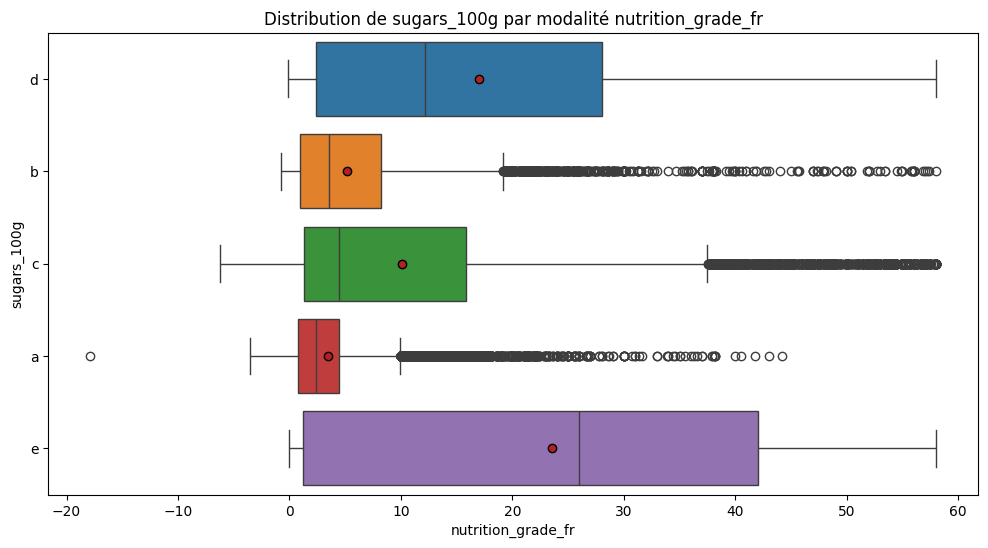

In [313]:
fig = plt.figure(figsize=(12,6))
meanprops = {'marker':'o', 'markeredgecolor':'black', 'markerfacecolor':'firebrick'}

ax = sns.boxplot(data=cleaned_data, y='nutrition_grade_fr', x='sugars_100g', hue='nutrition_grade_fr', meanprops=meanprops, showmeans=True)
ax.set_title("Distribution de sugars_100g par modalité nutrition_grade_fr")
ax.set_xlabel("nutrition_grade_fr")
ax.set_ylabel("sugars_100g")

plt.show()

In [91]:
from statsmodels.formula.api import ols
data_copy = cleaned_data.copy()
model = ols('sugars_100g ~ C(nutrition_grade_fr)', data=data_copy).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

# Affichage des résultats de l'ANOVA
print(anova_table)

                             sum_sq        df             F  PR(>F)
C(nutrition_grade_fr)  1.098614e+07       4.0  14997.780386     0.0
Residual               3.956182e+07  216032.0           NaN     NaN


la variable nutrition_grade_fr a un effet sur la variable sugars_100g.

**Tableau de contingences de l'anova entre la variable nutrition_grade_fr et les autres variables quantitatives**

In [326]:
cols = []
f_values = []
p_values = []


df_copy = cleaned_data.copy()
df_copy.rename({"nutrition-score-fr_100g": "nutrition_score_fr_100g", "saturated-fat_100g": "saturated_fat_100g"}, axis=1, inplace=True)

# Pour chaque variable quantitative, on effectue une ANOVA
for col in ['fiber_100g', 'energy_100g', 'sugars_100g', 'sodium_100g', 'saturated_fat_100g', 'proteins_100g']:
    Y = col
    formula = f"{Y} ~ C(nutrition_grade_fr)"
    model = ols(formula, data=df_copy).fit()
    aov_table = sm.stats.anova_lm(model, typ=2)
    
    # Ajouter les résultats aux listes
    cols.append(col)
    f_values.append(aov_table['F'].iloc[0])
    p_values.append(aov_table['PR(>F)'].iloc[0])

results_df = pd.DataFrame({
    'Variable': cols,
    'F-value': f_values,
    'p-value': p_values,
})


display(results_df)

,Variable,F-value,p-value
0,fiber_100g,3612.866459,0.0
1,energy_100g,33261.718573,0.0
2,sugars_100g,14501.708019,0.0
3,sodium_100g,6602.748344,0.0
4,saturated_fat_100g,61669.679964,0.0
5,proteins_100g,1300.314006,0.0


# FIN